# **Install Necessary Dependencies**

In [1]:
!pip install -U -q "tf-models-official" roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 99.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.8/85.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 115.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 109.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.2 MB/s eta 0:00:00
   ━━━━━

## Import required libraries

In [3]:
import os
import io
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen
from roboflow import Roboflow

## Import required libraries from tensorflow models

In [4]:
import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.19.0


# **Custom Dataset Preparation for Object Detection**



## Download Data From Roboflow

In [5]:
rf = Roboflow(api_key="ym3NLanE0xSdjYSZvx6x")
project = rf.workspace("rioooranteproject").project("cp-1")
version = project.version(8)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to CP-1-8 in coco:: 100%|██████████| 8409/8409 [00:01<00:00, 5037.86it/s]


### CLI command to convert data(train data).

In [6]:
%%bash

TRAIN_DATA_DIR='./CP-1-8/train'
TRAIN_ANNOTATION_FILE_DIR='./CP-1-8/train/_annotations.coco.json'
OUTPUT_TFRECORD_TRAIN='./bccd_coco_tfrecords/train'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=${TRAIN_DATA_DIR} \
  --object_annotations_file=${TRAIN_ANNOTATION_FILE_DIR} \
  --output_file_prefix=$OUTPUT_TFRECORD_TRAIN \
  --num_shards=1

2025-06-05 06:43:52.876783: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749105832.896283    1932 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749105832.902204    1932 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1749105832.917144    1932 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105832.917166    1932 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105832.917169    1932 computation_placer.cc:177] computation placer alr

### CLI command to convert data(validation data).

In [7]:
%%bash

VALID_DATA_DIR='./CP-1-8/valid'
VALID_ANNOTATION_FILE_DIR='./CP-1-8/valid/_annotations.coco.json'
OUTPUT_TFRECORD_VALID='./bccd_coco_tfrecords/valid'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$VALID_DATA_DIR \
  --object_annotations_file=$VALID_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_VALID \
  --num_shards=1

2025-06-05 06:44:03.537563: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749105843.557512    2033 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749105843.563455    2033 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1749105843.578267    2033 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105843.578292    2033 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105843.578294    2033 computation_placer.cc:177] computation placer alr

### CLI command to convert data(test data).

In [8]:
%%bash

TEST_DATA_DIR='./CP-1-8/test'
TEST_ANNOTATION_FILE_DIR='./CP-1-8/test/_annotations.coco.json'
OUTPUT_TFRECORD_TEST='./bccd_coco_tfrecords/test'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TEST_DATA_DIR \
  --object_annotations_file=$TEST_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TEST \
  --num_shards=1

2025-06-05 06:44:10.224249: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749105850.243807    2114 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749105850.249773    2114 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1749105850.264475    2114 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105850.264507    2114 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1749105850.264509    2114 computation_placer.cc:177] computation placer alr

# **Configure the Retinanet Resnet FPN COCO model for custom dataset**


In [9]:
train_data_input_path = './bccd_coco_tfrecords/train-00000-of-00001.tfrecord'
valid_data_input_path = './bccd_coco_tfrecords/valid-00000-of-00001.tfrecord'
test_data_input_path = './bccd_coco_tfrecords/test-00000-of-00001.tfrecord'
model_dir = './trained_model/'
export_dir ='./exported_model/'

In [10]:
exp_config = exp_factory.get_exp_config('retinanet_resnetfpn_coco')

## Adjust the model and dataset configurations so that it works with custom dataset

In [11]:
# Optimized configuration for Indonesian wildlife detection
batch_size = 16  # Increased for better gradient estimation
num_classes = 11  # Sesuai dengan jumlah kelas hewan (bukan 3)

HEIGHT, WIDTH = 512, 512  # Increased resolution for better detection
IMG_SIZE = [HEIGHT, WIDTH, 3]

# Backbone config
exp_config.task.freeze_backbone = False  # Keep unfrozen for fine-tuning
exp_config.task.annotation_file = ''

# Model config
exp_config.task.model.input_size = IMG_SIZE
exp_config.task.model.num_classes = num_classes + 1  # +1 for background class
exp_config.task.model.detection_generator.tflite_post_processing.max_classes_per_detection = exp_config.task.model.num_classes

# Enhanced anchor configuration for better detection
exp_config.task.model.anchor.aspect_ratios = [0.5, 1.0, 2.0]
exp_config.task.model.anchor.anchor_size = 4.0
exp_config.task.model.anchor.num_scales = 3

# Loss configuration optimization
exp_config.task.losses.focal_loss_alpha = 0.25
exp_config.task.losses.focal_loss_gamma = 1.5
exp_config.task.losses.huber_loss_delta = 0.1

# Training data config
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = batch_size
exp_config.task.train_data.parser.aug_scale_max = 1.0  # No scaling augmentation
exp_config.task.train_data.parser.aug_scale_min = 1.0  # No scaling augmentation

# Validation data config
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = batch_size

# Optimizer configuration
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.008
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = 15000
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 2000
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.0001

# Training steps optimization
exp_config.trainer.train_steps = 15000  # Sufficient for convergence
exp_config.trainer.validation_steps = 500
exp_config.trainer.steps_per_loop = 500
exp_config.trainer.summary_interval = 500
exp_config.trainer.checkpoint_interval = 1000
exp_config.trainer.validation_interval = 1000


# Mixed precision for faster training
exp_config.runtime.mixed_precision_dtype = 'float16'

## Adjust the trainer configuration.

In [12]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'

This may be broken in Colab.


## Print the modified configuration.

In [13]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'float16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'annotation_file': '',
                'differential_privacy_config': None,
      

<IPython.core.display.Javascript object>

### Set up the distribution strategy.

In [14]:
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print('Done')

Done


## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [15]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [16]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (16, 512, 512, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['cls_targets', 'box_targets', 'anchor_boxes', 'cls_weights', 'box_weights', 'image_info'])


### Create category index dictionary to map the labels to coressponding label names.

In [17]:
category_index = {
    1: {'id': 1, 'name': 'anoa'},
    2: {'id': 2, 'name': 'babirusa'},
    3: {'id': 3, 'name': 'biawak_pohon_biru'},
    4: {'id': 4, 'name': 'harimau_sumatera'},
    5: {'id': 5, 'name': 'jalak_bali'},
    6: {'id': 6, 'name': 'kakatua_jambul_kuning'},
    7: {'id': 7, 'name': 'kera_hitam'},
    8: {'id': 8, 'name': 'orangutan'},
    9: {'id': 9, 'name': 'owa_jawa'},
    10: {'id': 10, 'name': 'rusa_bawean'},
    11: {'id': 11, 'name': 'siamang'},
    12: {'id': 12, 'name': 'latar_belakang'}
}

tf_ex_decoder = TfExampleDecoder()

### Helper function for visualizing the results from TFRecords.
Use `visualize_boxes_and_labels_on_image_array` from `visualization_utils` to draw boudning boxes on the image.

In [18]:
def show_batch(raw_records, num_of_examples):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4)

    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Image-{i+1}')
  plt.show()

### Visualization of train data

The bounding box detection has two components
  1. Class label of the object detected (e.g.RBC)
  2. Percentage of match between predicted and ground truth bounding boxes.

**Note**: The reason of everything is 100% is because we are visualising the groundtruth.

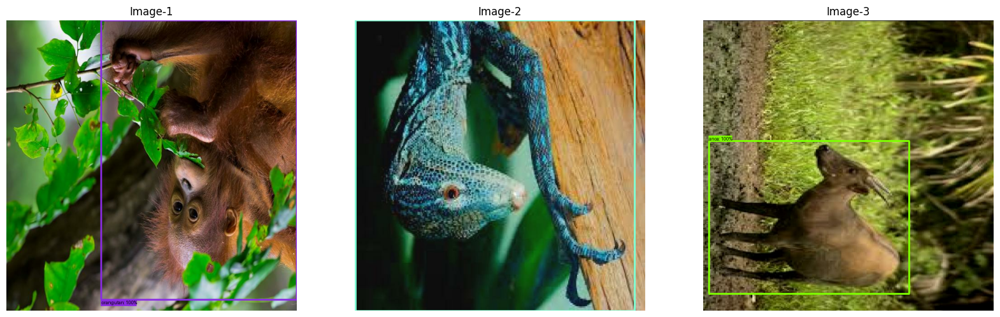

In [19]:
buffer_size = 20
num_of_examples = 3

raw_records = tf.data.TFRecordDataset(
    exp_config.task.train_data.input_path).shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records, num_of_examples)

## Train and evaluate.

We follow the COCO challenge tradition to evaluate the accuracy of object detection based on mAP(mean Average Precision). Please check [here](https://cocodataset.org/#detection-eval) for detail explanation of how evaluation metrics for detection task is done.

**IoU**: is defined as the area of the intersection divided by the area of the union of a predicted bounding box and ground truth bounding box.

In [20]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

restoring or initializing model...
train | step:      0 | training until step 1000...
train | step:    500 | steps/sec:    4.5 | output: 
    {'box_loss': 0.007832204,
     'cls_loss': 1.0544084,
     'learning_rate': 0.0019885455,
     'model_loss': 1.4460177,
     'total_loss': 1.8817732,
     'training_loss': 1.8817732}
saved checkpoint to ./trained_model/ckpt-500.
train | step:   1000 | steps/sec:    5.9 | output: 
    {'box_loss': 0.0050028577,
     'cls_loss': 0.4860228,
     'learning_rate': 0.003877091,
     'model_loss': 0.7361651,
     'total_loss': 1.1713963,
     'training_loss': 1.1713963}
 eval | step:   1000 | running 500 steps of evaluation...
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.01s).
Accumulating evaluation results...
DONE (t=0.24s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.409
 Average Precision  (AP) @[ IoU=0.50      | area=   all

## Load logs in tensorboard.

In [21]:
%load_ext tensorboard
%tensorboard --logdir './trained_model/'

<IPython.core.display.Javascript object>

## Saving and exporting the trained model.

The `keras.Model` object returned by `train_lib.run_experiment` expects the data to be normalized by the dataset loader using the same mean and variance statiscics in `preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB)`. This export function handles those details, so you can pass `tf.uint8` images and get the correct results.

In [22]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

## Inference from trained model

In [23]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

### Visualize test data.

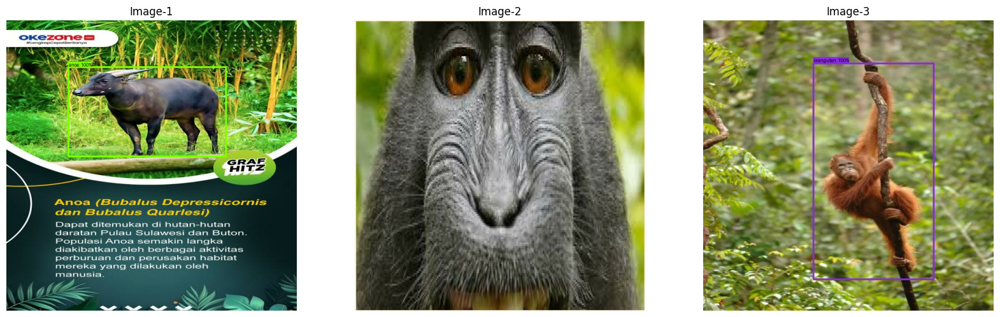

In [24]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    './bccd_coco_tfrecords/test-00000-of-00001.tfrecord').take(
        num_of_examples)
show_batch(test_ds, num_of_examples)

### Importing SavedModel.

In [25]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

### Visualize predictions.

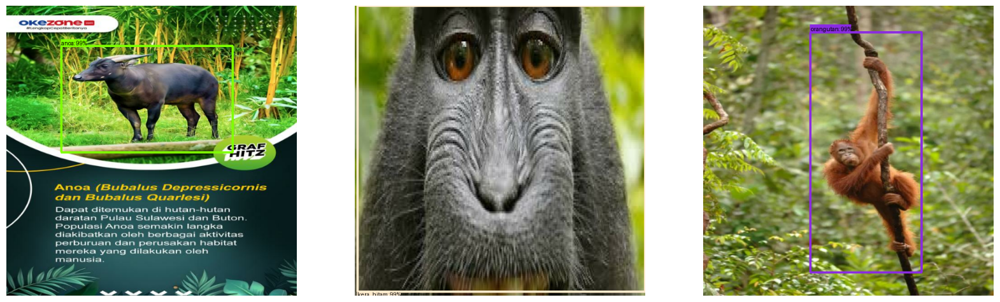

In [26]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.30 # Change minimum score for threshold to see all bounding boxes confidences.

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  visualization_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      result['detection_boxes'][0].numpy(),
      result['detection_classes'][0].numpy().astype(int),
      result['detection_scores'][0].numpy(),
      category_index=category_index,
      use_normalized_coordinates=False,
      max_boxes_to_draw=200,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=None,
      line_thickness=4)
  plt.imshow(image_np)
  plt.axis('off')

plt.show()

In [2]:
!zip -r "/content/exported_model.zip" "/content/exported_model"
!zip -r "/content/trained_model.zip" "/content/trained_model"

  adding: content/exported_model/ (stored 0%)
  adding: content/exported_model/saved_model.pb (deflated 91%)
  adding: content/exported_model/assets/ (stored 0%)
  adding: content/exported_model/variables/ (stored 0%)
  adding: content/exported_model/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: content/exported_model/variables/variables.index (deflated 79%)
  adding: content/exported_model/params.yaml (deflated 70%)
  adding: content/exported_model/fingerprint.pb (stored 0%)
  adding: content/trained_model/ (stored 0%)
  adding: content/trained_model/validation/ (stored 0%)
  adding: content/trained_model/validation/events.out.tfevents.1749106090.844a53961916.1479.1.v2 (deflated 74%)
  adding: content/trained_model/checkpoint (deflated 72%)
  adding: content/trained_model/ckpt-11500.data-00000-of-00001 (deflated 7%)
  adding: content/trained_model/ckpt-12500.index (deflated 84%)
  adding: content/trained_model/ckpt-15000.index (deflated 84%)
  adding: content/trained